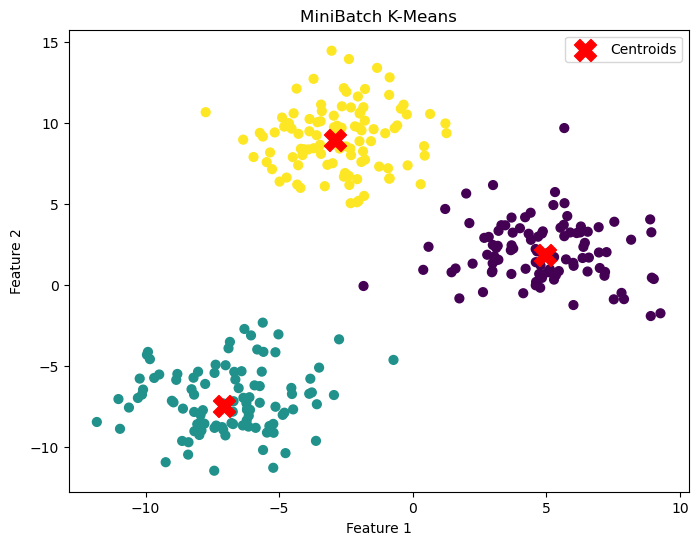

In [3]:
import matplotlib.pyplot as plt
from sklearn.datasets import make_blobs
from sklearn.cluster import MiniBatchKMeans

# Generate data
X, _ = make_blobs(
    n_samples=300,
    centers=3,
    cluster_std=2.0,
    random_state=42
)

# MiniBatch KMeans
model = MiniBatchKMeans(
    n_clusters=3,
    batch_size=20,
    random_state=42
)

labels = model.fit_predict(X)

# Plot clusters
plt.figure(figsize=(8,6))

plt.scatter(
    X[:,0],
    X[:,1],
    c=labels,
    cmap='viridis',
    s=40
)

# Plot centroids
plt.scatter(
    model.cluster_centers_[:,0],
    model.cluster_centers_[:,1],
    c='red',
    marker='X',
    s=250,
    label='Centroids'
)

plt.xlabel("Feature 1")
plt.ylabel("Feature 2")
plt.title("MiniBatch K-Means")
plt.legend()
plt.show()

In [9]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from sklearn.datasets import make_blobs
from IPython.display import HTML

# ------------------------------------
# Euclidean Distance Function
# ------------------------------------
def euclidean_distance(x, centroids):
    return np.sqrt(np.sum((centroids - x) ** 2, axis=1))


# ------------------------------------
# Mini-Batch K-Means Algorithm
# ------------------------------------
def mini_batch_kmeans(X, k, b, t):

    # Randomly initialize centroids
    centroids = X[np.random.choice(X.shape[0], k, replace=False)]

    # Store centroid history
    centroids_history = [centroids.copy()]

    # Count updates for each centroid
    v = np.zeros(k)

    # Run algorithm
    for i in range(t):

        # Select a random mini-batch
        M = X[np.random.choice(X.shape[0], b, replace=False)]

        # Update centroids
        for x in M:

            # Compute distances
            distances = euclidean_distance(x, centroids)

            # Find nearest centroid
            nearest_centroid_index = np.argmin(distances)

            # Update count
            v[nearest_centroid_index] += 1

            # Learning rate
            eta = 1 / v[nearest_centroid_index]

            # Update centroid
            centroids[nearest_centroid_index] = (
                (1 - eta) * centroids[nearest_centroid_index]
                + eta * x
            )

            # Save centroid positions
            centroids_history.append(centroids.copy())

    return centroids, centroids_history


# ------------------------------------
# Generate Synthetic Dataset
# ------------------------------------
X, _ = make_blobs(
    n_samples=300,
    centers=3,
    n_features=2,
    cluster_std=3.0,
    random_state=42
)

# ------------------------------------
# Parameters
# ------------------------------------
k = 3      # Number of clusters
b = 10     # Batch size
t = 20     # Number of iterations

# ------------------------------------
# Run Mini-Batch K-Means
# ------------------------------------
final_centroids, centroids_history = mini_batch_kmeans(X, k, b, t)

print("Final Centroids:")
print(final_centroids)

# ------------------------------------
# Animation Function
# ------------------------------------
fig, ax = plt.subplots(figsize=(8,6))

def animate(i):

    ax.clear()

    # Plot all data points
    ax.scatter(
        X[:,0],
        X[:,1],
        c='lightgray',
        alpha=0.6,
        s=35
    )

    # Plot centroids
    for j, c in enumerate(centroids_history[i]):
        ax.scatter(
            c[0],
            c[1],
            color=f"C{j}",
            marker="X",
            s=300,
            edgecolors="black",
            linewidths=2,
            label=f"Centroid {j+1}"
        )

    ax.set_title(f"Mini-Batch K-Means\nFrame {i+1}/{len(centroids_history)}")

    ax.set_xlabel("Feature 1")
    ax.set_ylabel("Feature 2")

    ax.set_xlim(np.min(X[:,0])-1, np.max(X[:,0])+1)
    ax.set_ylim(np.min(X[:,1])-1, np.max(X[:,1])+1)

    ax.legend(loc="upper right")


# ------------------------------------
# Create Animation
# ------------------------------------
ani = animation.FuncAnimation(
    fig,
    animate,
    frames=len(centroids_history),
    interval=150,
    repeat=False
)

plt.close(fig)   # Prevent duplicate static figure

# ------------------------------------
# Display Animation (No FFmpeg Needed)
# ------------------------------------
HTML(ani.to_jshtml())

Final Centroids:
[[-6.71784219 -7.90345714]
 [-2.37056418  8.6885695 ]
 [ 4.33190532  1.18486298]]
